# Chapter 5: Probability Distributions

__Probability__ takes on a value from 0 to 1, with a probability $P(X) = 0$ for an event meaning that the stated condition - e.g., a standard 6 sided die will yield a 7 when rolled -  would never occur in an infinite number of flips. A probability of 0.5 means that in a sufficiently large number of trials, approximately half of the trials would result in the stated condition. A probability of 1 means all trials would result in the stated condition so that the number of successes in a trial would be equal to the number of attempts. 

__Probability Distributions__ display all of the possible values that a _random variable_ $X$ could take on on the x-axis, and the corresponding probability of that value on the y-axis. Hence, the area under the probability distribution will always be equal to one. 
   - The random variable $\bar{X}$, which represents the the mean of a sample drawn from a larger population, defines a _**sampling distribution**_, which gives all values possible for $\bar{X}$, $\bar{X_i}$, and the probability of that value occuring. $\bar{X}$ can take on values falling on its sampling distribution, which describe the likelihood of getting a given mean for a given sample size.  This sampling distribution takes on a standard deviation of $\frac{S}{\sqrt(n)}$, otherwise known as the **standard error.** 

Distributions can be described by: 
- Their mean, $\mu$(or $\bar{X}$ for sampling distributions), which is the average value of the dataset.  
- Their standard deviation, $\sigma$, which determines how flat the curve is, and how densely the data clusters around the mean(SE for sampling distributions).
- Skewness, $S_{KP}$, which refers to a distortion or asymmetry of a distribution. 
- Kurtosis, $k$, which describes how much of the distribution lays in its tails. 

### Types of Probability Distributions
#### Normal Distributions
Normal Distribution, also known as Gaussian distribution, is ubiquitous in Data Science and often used when modeling economic phenomena. You will encounter it in predictive models you create. It is one of the assumptions of many statistical techniques.

A normal distribution has a bell-shaped density curve described by its mean $\mu$ and standard deviation $\sigma$. The density curve is symmetrical(skewness of 0), centered about its mean, with its spread determined by its standard deviation. Data near the mean - e.g., $\sigma < 1$ - are more frequent in occurrence than data far from the mean - e.g., $\sigma > 2$. 


A random variable $X$ which follows a normal distribution with mean $\mu$ and standard deviation $\sigma$ and has this density function: 
<h3 align="center">
    <font size="4">
        $ X = \frac{1}{\sigma\sqrt{2\pi}}e^{-\frac{1}{2}(\frac{x-\mu}{\sigma})^2} $
    </font>
    </h3> 
    
If one knew the mean and standard deviation of a particular distribution, it would be possible to estimate the probability of drawing a value from a particular range - e.g., $a \leq X \leq b$ - by taking the definite integral of this function: 
<h3 align="center">
    <font size="4">
        $\int_{a}^{b}\frac{1}{\sigma\sqrt{2\pi}}e^{-\frac{1}{2}(\frac{x-\mu}{\sigma})^2}dx$.
    </font>
</h3>

#### Standard Normal Distribution

The standardized normal distribution is the most important member of the family of normal probability distributions—the one with $\mu = 0$  and $\sigma = 1$. The normal random variable distributed according to the standard normal distribution is called the standard normal variable and is denoted by $Z$. It represents the number of standard deviations a given point X lies from the mean of the standard normal distribution.  It is expressed as
<h3 align="center">
    <font size="4">
        $ Z =  \frac{X-\mu}{\sigma}$
    </h3> 

A key feature of all distributions is that, using the equation above, they can be transformed to be analyzed using the standard normal distribution.
    
_If you divide any normal distribution by its standard deviation(normalizing the SD to be 1), that normal distribution becomes the standard normal distribution._

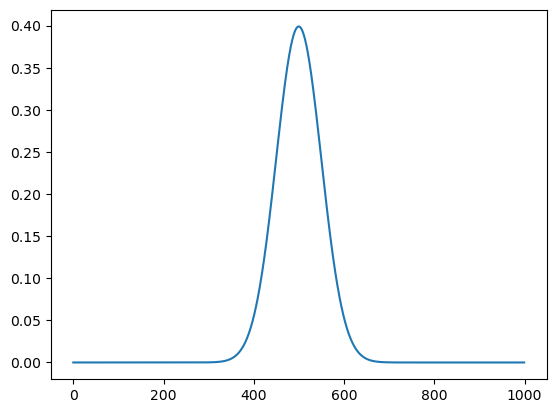

In [1]:
import math
import matplotlib.pyplot as plt
import numpy as np
from stats import *

# takes a list of x values in a given range with some number of finite 
#  divisions, will create a y value that correlates with each x value
#  that was passed
def normal_dist(mean, sd, x = np.linspace(-10,10, 1000)):
    prob_density = 1 / (sd * (2 * np.pi) ** .5) * np.exp(
        -0.5 * ((x - mean) / sd) ** 2)
    return prob_density

normal_dist_list = normal_dist(mean = 0, sd = 1)
plt.plot(normal_dist_list)

Text(0.5, 1.0, '$\\mu$ = 0\t$\\sigma_0$ = 1\t$\\sigma_1$ = 2\t$\\sigma_2$ = 3\t')

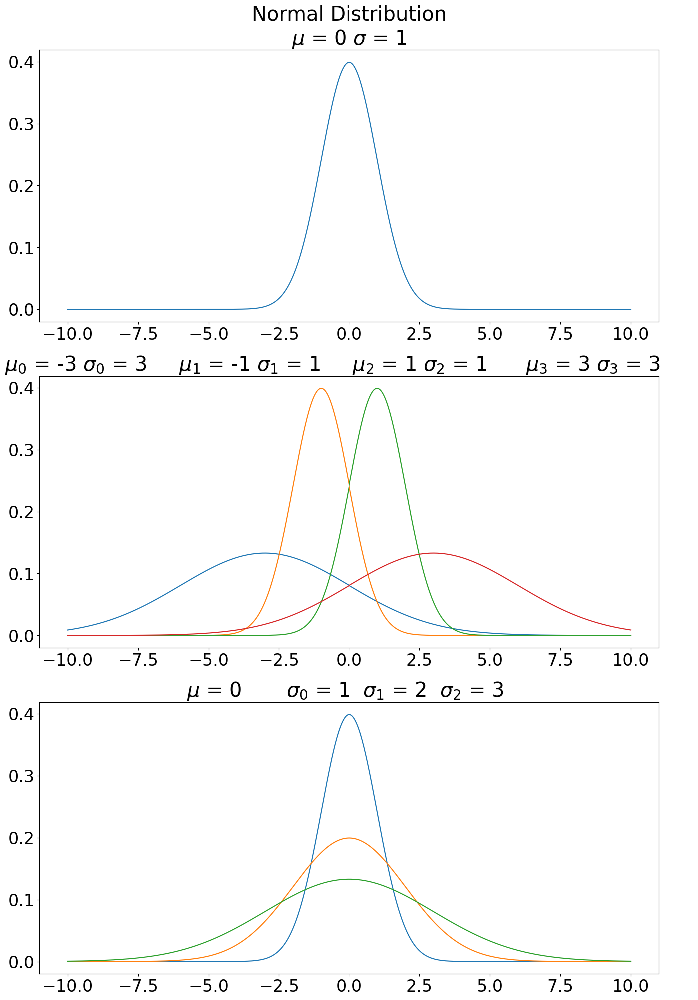

In [2]:
plt.rcParams.update({"font.size":24})
fig, axs = plt.subplots(3, 1, figsize = (16, 24))
x = np.linspace(-10, 10, 1000)

# perform transformation
mean_, sd = 0, 1
normal_dist_list = normal_dist(mean = mean_, sd = sd, x = x)
axs[0].plot(x, normal_dist_list)
axs[0].set_title("Normal Distribution\n$\mu$ = " + \
                str(mean_) + " $\sigma$ = " + str(sd))

ax1_title = ""
ax1_sub = 0
for mean_ in range(-3,4,2):
    sd = abs(mean_)
    normal_dist_list = normal_dist(mean = mean_, sd = sd)
    axs[1].plot(x, normal_dist_list)
    ax1_title = ax1_title + "$\mu_" +str(ax1_sub) + "$ = " + str(mean_) + " "
    ax1_title = ax1_title + "$\sigma_" + str(ax1_sub) + "$ = " + str(sd) + "\t"
    ax1_sub += 1
axs[1].set_title(ax1_title)

ax2_title = "$\mu$ = 0\t"
ax2_sub = 0
for sd in range(1,4):
    mean_ = 0
    normal_dist_list = normal_dist(mean = mean_, sd = sd)
    axs[2].plot(x, normal_dist_list)
    ax2_title = ax2_title + "$\sigma_" + str(ax2_sub) + "$ = " + str(sd) + "\t"
    ax2_sub += 1
axs[2].set_title(ax2_title)

## Lognormal Distribution

A random variable $X$ is said to have a lognormal distribution if $Y = ln(X)$ is normally distributed, where $ln$ denotes the natural logarithm.

In other words, $X$ is log-normally distributed if the natural logarithm of $X$ is normally distributed with mean $\mu$  and variance $\sigma ^2$:

$ln(X) = N(\mu, \sigma^2)$

The lognormal distribution is positively skewed with many small values and just a few large values. Consequently, the mean is greater than the mode in most cases.
Since the lognormal distribution is bound by zero on the lower side, it is perfect for modeling asset prices that cannot take negative values. On the other hand, the normal distribution cannot be used for the same purpose because it has a negative side.

When the returns on a stock (continuously compounded) follow a normal distribution(as shown above), the stock prices follow a lognormal distribution. Note that even if returns do not follow a normal distribution, the lognormal distribution is still the most appropriate model for stock prices.

The probability density function of the distribution is:
<h3 align="center">
    <font size="4">
        $f(x) = \frac{1}{x\sigma\sqrt{2\pi}}e^{\frac{- (lnx-\mu)^2}{2\sigma^2}}$
    </font>
    </h3> 



In [3]:
import warnings
warnings.filterwarnings("ignore")

def create_lognormal(mean, sd, x = np.linspace(0,10, 1000)):
    density_points = (1 / x * sd * np.sqrt(2 * np.pi)) * np.e **(
        -(np.log(x) - mean) ** 2 /  (2 * sd ** 2))
    return density_points

x = np.linspace(0,10, 10000)
mean, sd = 1, 1
log_norm = create_lognormal(mean = mean, sd = sd, x = x)

Text(0.5, 1.0, 'Lognormal Distribution with μ = 1 and σ = 1')

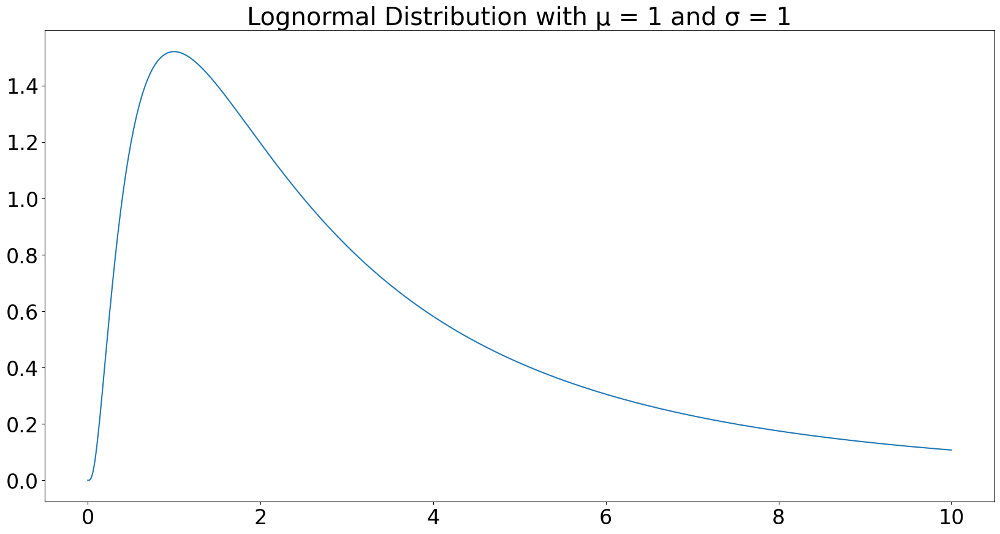

In [4]:
fig, ax = plt.subplots(figsize = (20,10))
ax.plot(x, log_norm)
ax.set_title(
    "Lognormal Distribution with μ = " + str(mean) +" and σ = " + str(sd))

Text(0.5, 1.0, 'Lognormal Distribution with μ = 1 and σ = 1')

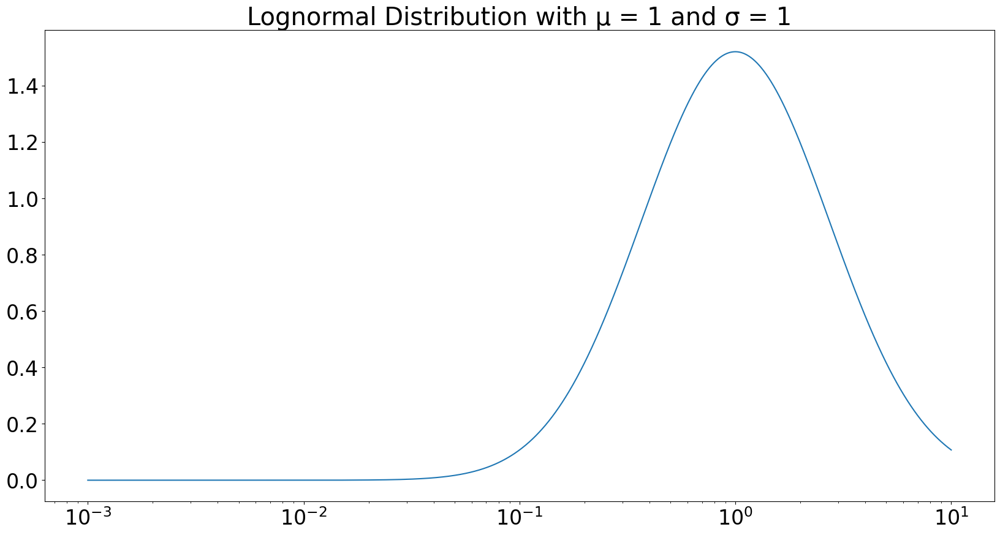

In [5]:
fig, ax = plt.subplots(figsize = (20,10))
ax.plot(x, log_norm)
plt.xscale("log")
ax.set_title(
    "Lognormal Distribution with μ = " + str(mean) +" and σ = " + str(sd))

### Binomial Distribution
If $X$ is a random variable that yields the number of successess seen in the trials of a binomial(yes or no) experiment, then we say that $X$ follows a binomial distribution.

We are interested in finding the probability that some particular number of successes is seen in the course of that binomial experiment.

- $n$ = the number of trials
- $x$ = some number of successes, with $0≤x≤n$
- $p$ = the probability of success on any one trial
- $q$ = $1−p$ = the probability of failure on any one trial

A binomial trial can result in a success with probability $p$ and a failure with probability $q = 1−p$. Then the probability distribution of the binomial random variable $X$, the number of successes in $n$ independent trials, is
<h3 align="center">
    <font size="4">
        $b(x; n, p) = {n \choose x}p^xq^{n-x}$
    </font>
    </h3> 

Where  $x = 0, 1, 2,..., n$ and ${n \choose x}=\frac{n!}{x!(n-x)!}$

The most common example is flipping a coin, which can be modeled as $x=$ the number of "heads" or "tails" in $n$ trials. The probability of success and failure is 0.5. 

The mean $\mu$ and standard deviation $\sigma$ for a binomial distribution $b(x; n, p)$ are
- $\mu = np$
- $\sigma = \sqrt{np(1-p)}$

We define and graph the binomial distribution for various x, p, and n values. 

As an example of the binomial distribution, we can think of the top hedge funds in the stock market. If we assume that the markets are efficient and any given mutual fund only has a 50% probability of beating the market in every year, if there is a large $n$, or a large number of firms, many of them will survive for many years, just by chance. This example is demonstrated wonderfully in Burton Malkiel's *A Random Walk Down Wallstreet* in which he describes a coin flipping contest of 1000 people, which guarantees that multiple people will win more than 10 rounds simply by chance, and then become world-renouned as amazing coin-flippers. 

- How many funds will 'beat' an efficient market for more than 10 years if there are 1000 funds to start? We will find the probability of a single fund beating the market for that long and then multiply that by 1000 funds. 

- $ = P(1) = {10 \choose 1}0.5^{1}0.5^{10-1} = 0.0097$, so there is a 0.97% chance of a single fund beating an efficient market for 10 years, and we can reasonably expect that 97 funds will beat the market for 10 years if 100 start, just by chance. 


In [6]:
def binomial(x, n, p):
    q = 1 - p
    return float(math.factorial(n)) / (
        math.factorial(x) * math.factorial(n-x)) * p ** x * q ** (n - x)
binomial(x = 50, n = 100, p =.5)

0.07958923738717875

In [7]:
# probability of generating a total betwenn X0 and X1 for a given p, n
def probability_of_outcome(X0, X1, p, n):
    P = 0
    for x in range(X0, X1 + 1):
        P += binomial(x = x, n = n, p = p) 
    return P

p, n = .5, 100
X0 = 40
X1 = 60

probability_of_outcome(X0, X1, p, n)

0.9647997997822952

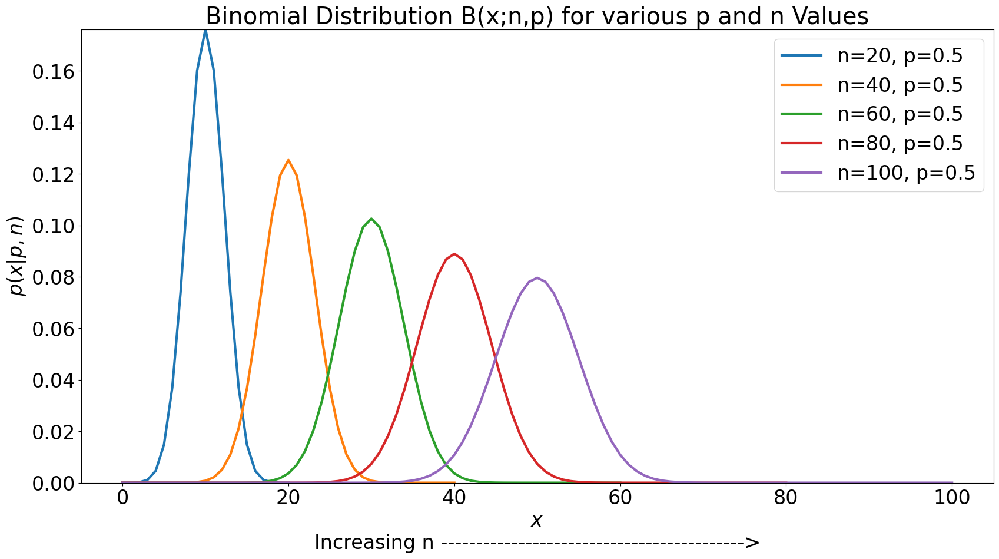

In [8]:
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import Normalize

fig, ax = plt.subplots(figsize = (20, 10))
cmap = cm.get_cmap("Blues")
ymax = binomial(20 * p, 20, p)
for n in range(20, 101, 20):
#     x = int(n * p)
    # make a list of probability of every possible outcome
    #  from 0 to n
    binom_vars = [binomial(x, n, p) for x in range(n + 1)]
    # plot_line that is composed of all probabilities
    plt.plot(binom_vars, 
             linewidth = 3,
            label=f"n={n}, p={p}")
# change max y axis value from 1 to the something closer to the maximum
#  probabity across all range from 0 to n for which we constructed 
#  distributions
ax.set_ylim(ymin = 0, ymax = ymax)

plt.xlabel("$x$\nIncreasing n ------------------------------------------->",
           fontsize=24)
plt.ylabel("$p(x | p, n)$", fontsize=24)
plt.title("Binomial Distribution B(x;n,p) for various p and n Values")
plt.legend()


    
    

In [9]:
import pandas_datareader.data as web
import yfinance as yf
import datetime

In [10]:
yf.pdr_override()
start = datetime.datetime(2012, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = ["MSFT", "AAPL", "PG", "TSLA"]
for stock in stocks:
    data_dict[stock] = web.get_data_yahoo(stock, start, end)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [11]:
data_dict["MSFT"]

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-01-03,26.549999,26.959999,26.389999,26.770000,21.413063,64731500
2012-01-04,26.820000,27.469999,26.780001,27.400000,21.916996,80516100
2012-01-05,27.379999,27.730000,27.290001,27.680000,22.140966,56081400
2012-01-06,27.530001,28.190001,27.530001,28.110001,22.484924,99455500
2012-01-09,28.049999,28.100000,27.719999,27.740000,22.188961,59706800
...,...,...,...,...,...,...
2023-03-24,277.239990,280.630005,275.279999,280.570007,280.570007,28172000
2023-03-27,280.500000,281.459991,275.519989,276.380005,276.380005,26840200
2023-03-28,275.790009,276.140015,272.049988,275.230011,275.230011,21878600


## Create a dataframe for the close data of all four stocks

In [12]:
[df["Close"] for df in data_dict.values()]
# data_dict.keys()

[Date
 2012-01-03     26.770000
 2012-01-04     27.400000
 2012-01-05     27.680000
 2012-01-06     28.110001
 2012-01-09     27.740000
                  ...    
 2023-03-24    280.570007
 2023-03-27    276.380005
 2023-03-28    275.230011
 2023-03-29    280.510010
 2023-03-30    282.712891
 Name: Close, Length: 2829, dtype: float64,
 Date
 2012-01-03     14.686786
 2012-01-04     14.765714
 2012-01-05     14.929643
 2012-01-06     15.085714
 2012-01-09     15.061786
                  ...    
 2023-03-24    160.250000
 2023-03-27    158.279999
 2023-03-28    157.649994
 2023-03-29    160.770004
 2023-03-30    162.035004
 Name: Close, Length: 2829, dtype: float64,
 Date
 2012-01-03     66.830002
 2012-01-04     66.800003
 2012-01-05     66.519997
 2012-01-06     66.360001
 2012-01-09     66.639999
                  ...    
 2023-03-24    146.720001
 2023-03-27    145.949997
 2023-03-28    146.360001
 2023-03-29    146.809998
 2023-03-30    146.884995
 Name: Close, Length: 2829, dtype: f

In [13]:
close_data = pd.concat([df["Close"] for df in data_dict.values()],
                      keys = data_dict.keys(),
                      axis = 1)
close_data

,MSFT,AAPL,PG,TSLA
Date,,,,
2012-01-03,26.770000,14.686786,66.830002,1.872000
2012-01-04,27.400000,14.765714,66.800003,1.847333
2012-01-05,27.680000,14.929643,66.519997,1.808000
2012-01-06,28.110001,15.085714,66.360001,1.794000
2012-01-09,27.740000,15.061786,66.639999,1.816667
...,...,...,...,...
2023-03-24,280.570007,160.250000,146.720001,190.410004
2023-03-27,276.380005,158.279999,145.949997,191.809998
2023-03-28,275.230011,157.649994,146.360001,189.190002


Text(0.5, 1.0, 'Daily Stock Prices')

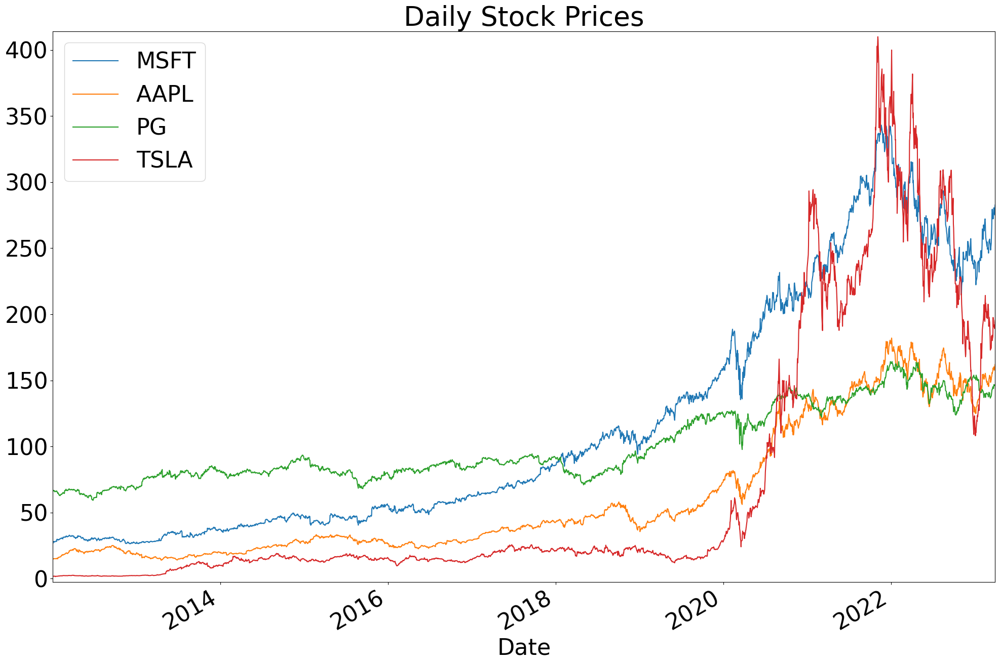

In [14]:
import matplotlib.pyplot as plt
plt.rcParams['axes.xmargin'] = 0  
plt.rcParams['axes.ymargin'] = .01  
plt.rcParams.update({'font.size': 32})
fig, ax = plt.subplots(figsize = (24, 16))
close_data.plot.line(ax = ax, legend = True)
ax.set_title("Daily Stock Prices")

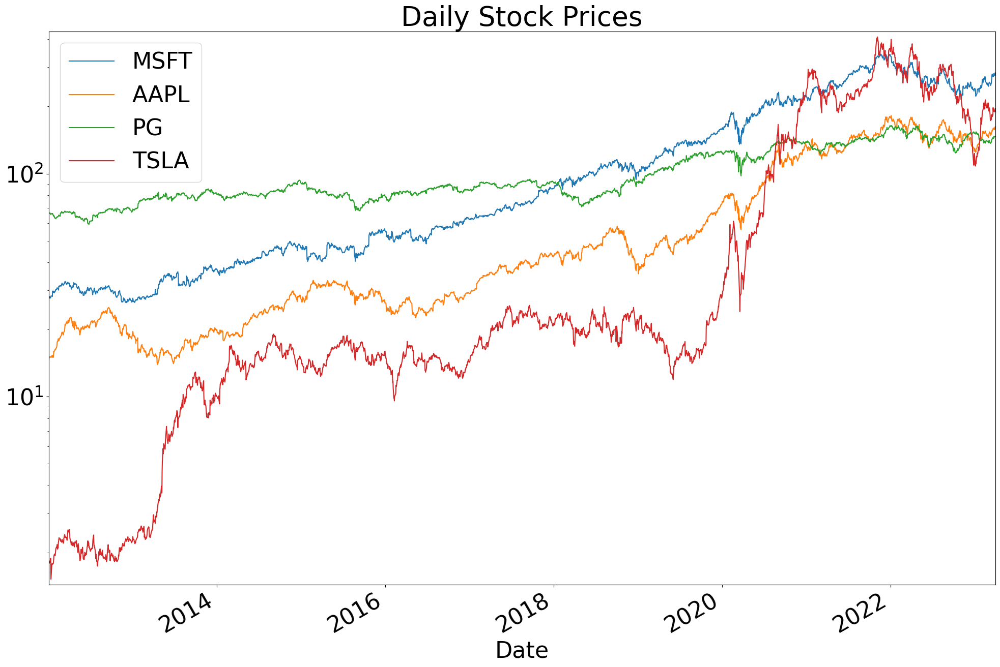

In [15]:
fig, ax = plt.subplots(figsize = (24, 16))
close_data.plot.line(ax = ax, legend = True)
ax.set_title("Daily Stock Prices")
ax.set_yscale("log")

Text(0.5, 1.0, 'AAPL')

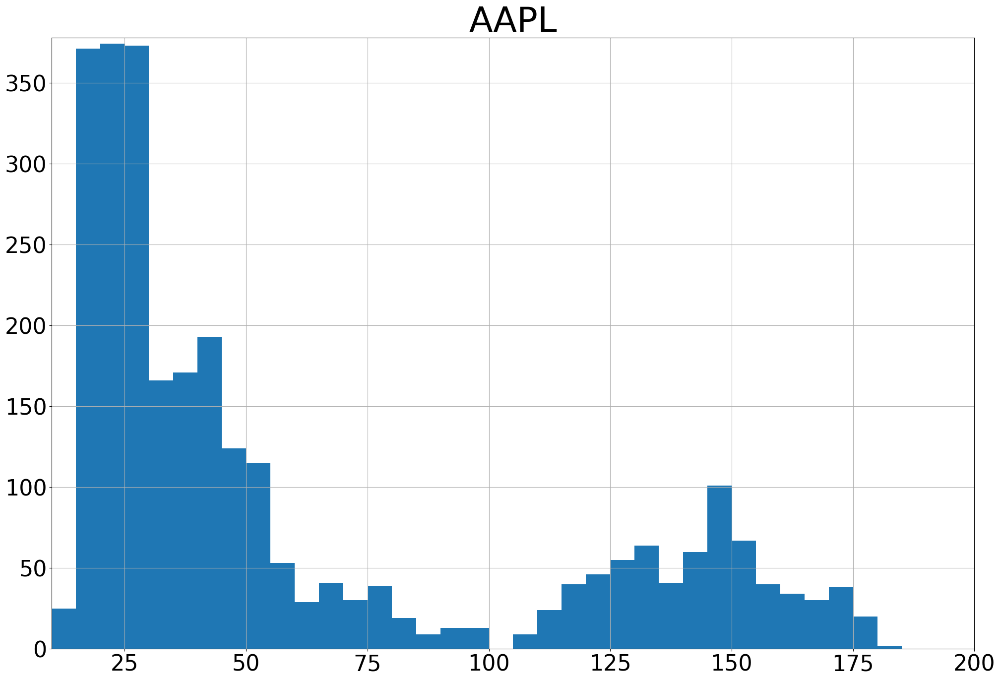

In [16]:
fig, ax = plt.subplots(figsize = (24, 16))
stock = "AAPL"
# close_data[stock].hist(bins = 50)
close_data[stock].hist(bins = [i for i in range(10,201, 5)])
ax.set_title(stock, fontsize  = 50)

In [17]:
log_data = np.log(close_data)
log_data

,MSFT,AAPL,PG,TSLA
Date,,,,
2012-01-03,3.287282,2.686948,4.202152,0.627007
2012-01-04,3.310543,2.692308,4.201703,0.613743
2012-01-05,3.320710,2.703349,4.197503,0.592221
2012-01-06,3.336125,2.713748,4.195094,0.584448
2012-01-09,3.322875,2.712161,4.199305,0.597003
...,...,...,...,...
2023-03-24,5.636823,5.076735,4.988526,5.249180
2023-03-27,5.621777,5.064366,4.983264,5.256505
2023-03-28,5.617607,5.060377,4.986069,5.242752


Text(0.5, 1.0, 'AAPL')

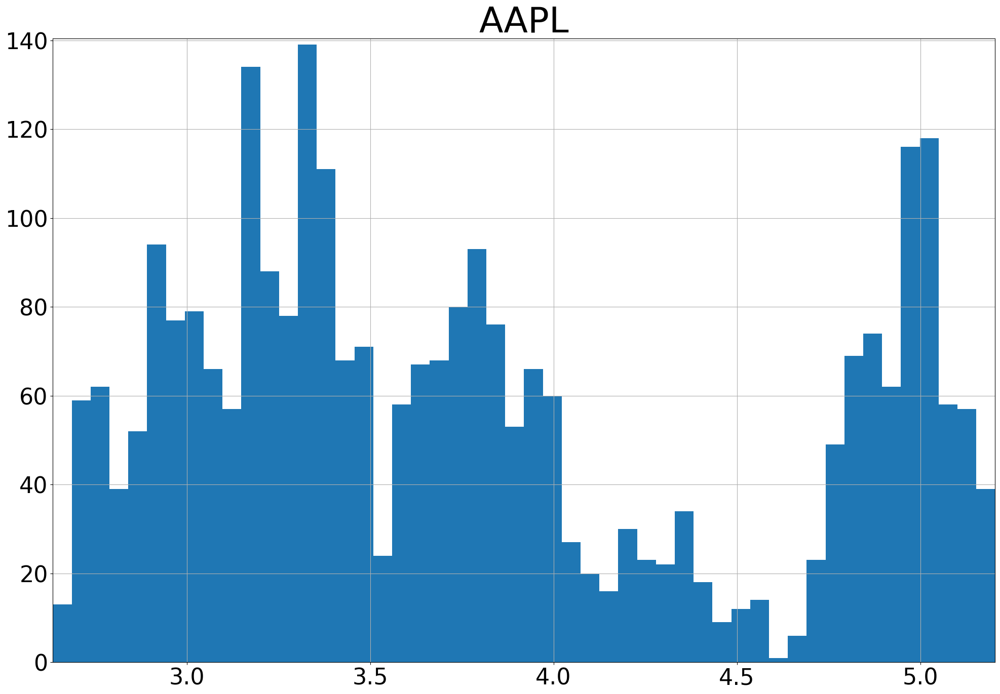

In [18]:
fig, ax = plt.subplots(figsize = (24, 16))
log_data[stock].hist(bins = 50)
ax.set_title(stock, fontsize  = 50)

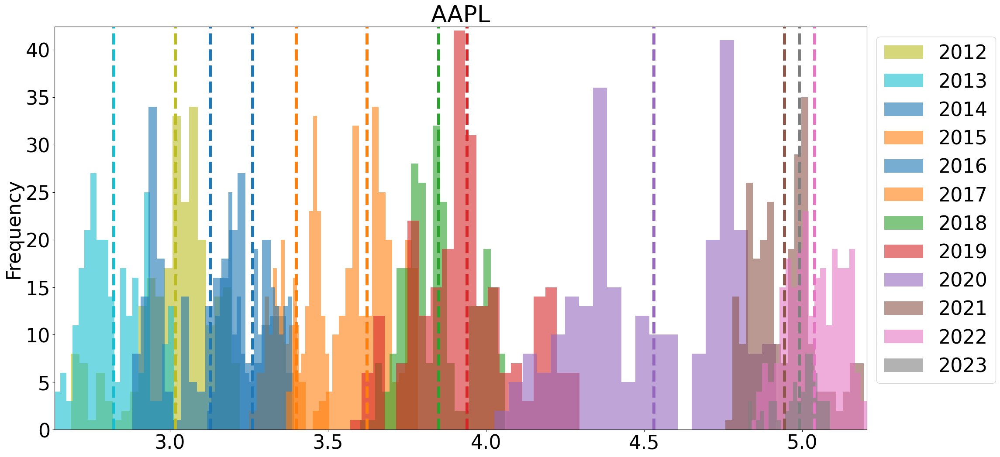

In [19]:
def graph_yearly_distributions(data, stock, figsize = (24,12), density = False):
    years = sorted(list(set(data.index.year)))
    fig, ax = plt.subplots(figsize = figsize)
    for year in years:
        color = "C" + str(year % 12)
        year = str(year)
        plot_data = data[stock].loc[year]
        plot_data.plot.hist(color = color, 
                            alpha = .6, 
                            label = year,
                            bins = 20,
                            density = density,
                            ax = ax)
        ax.axvline(plot_data.mean(),
                  color = color,
                  linewidth = 5,
                  ls = "--")
        ax.set_title(stock)
        ax.legend(bbox_to_anchor = (1,1))
        
    
    
graph_yearly_distributions(log_data, stock, density = False)

In [20]:
price_change_data = log_data.diff()
price_change_data

,MSFT,AAPL,PG,TSLA
Date,,,,
2012-01-03,NaN,NaN,NaN,NaN
2012-01-04,0.023261,0.005360,-0.000449,-0.013264
2012-01-05,0.010167,0.011041,-0.004201,-0.021522
2012-01-06,0.015415,0.010400,-0.002408,-0.007773
2012-01-09,-0.013250,-0.001587,0.004211,0.012556
...,...,...,...,...
2023-03-24,0.010426,0.008271,0.020172,-0.009461
2023-03-27,-0.015047,-0.012369,-0.005262,0.007326
2023-03-28,-0.004170,-0.003988,0.002805,-0.013753


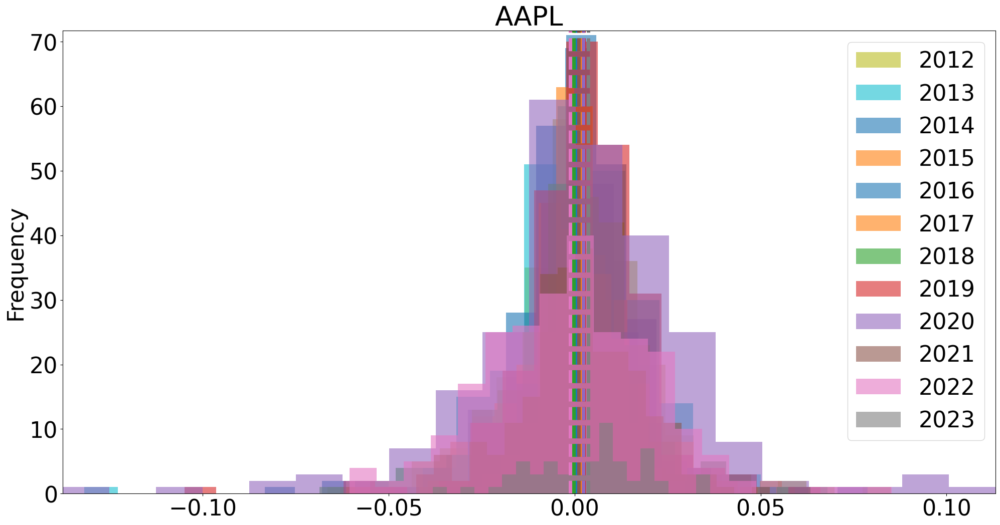

In [21]:
graph_yearly_distributions(price_change_data, stock, density = False)

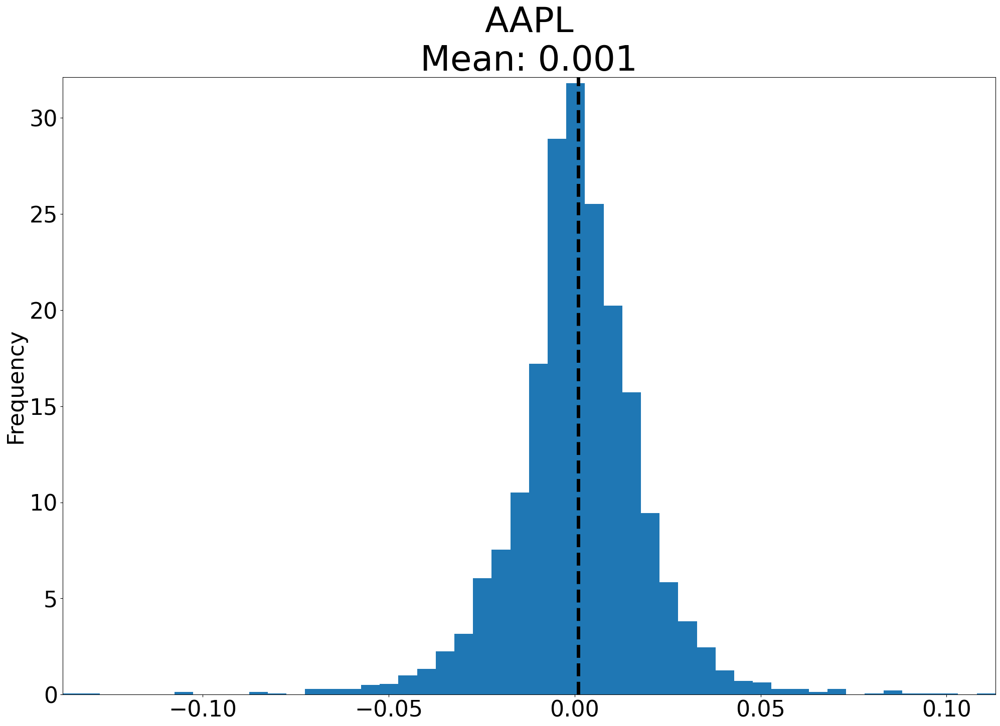

In [22]:
fig, ax = plt.subplots(figsize = (24, 16))
stock = "AAPL"
price_change_mean = round(price_change_data[stock].mean(),3)
price_change_data[stock].dropna().plot.hist(bins = 50, density = True)
ax.set_title(stock + "\nMean: " + str(price_change_mean), fontsize  = 50)
ax.axvline(price_change_mean, color = "k", linewidth = 5, 
          ls ="--")


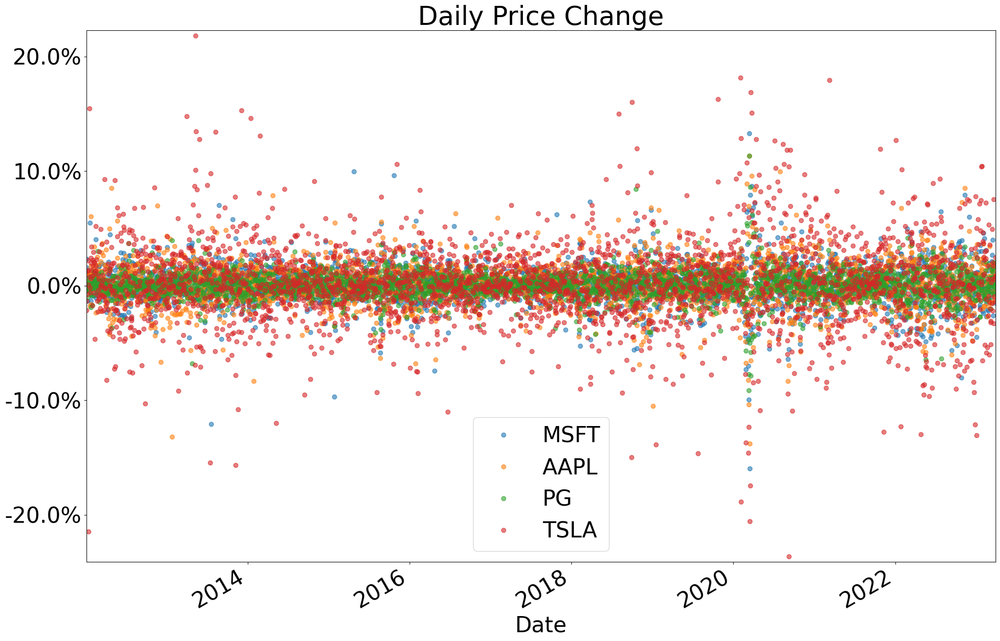

In [23]:
fig, ax = plt.subplots(figsize = (24, 16))
for key in price_change_data.keys():
    price_change_data[key].plot.line(marker = ".", 
                                     markersize = 13,
                                     alpha = .6,
                                     ls = "", 
                                     ax =ax)
ax.set_title("Daily Price Change")

# access y-axis values
y_vals = ax.get_yticks()
# transform y-axis values to be in form of percent instead decimal
ax.set_yticklabels([str(round(y * 100,1)) + "%" for y in y_vals])
plt.legend()

In [24]:
from stats import *
stats_df = gather_statistics(price_change_data.mul(100), 
                             sample = True).round(2)
stats_df

,MSFT,AAPL,PG,TSLA
mean,0.08,0.08,0.03,0.16
median,0.06,0.08,0.04,0.14
variance,2.82,3.35,1.28,12.86
S.D.,1.68,1.83,1.13,3.58
skewness,-0.22,-0.28,-0.04,-0.05
kurtosis,8.73,5.73,12.03,5.07


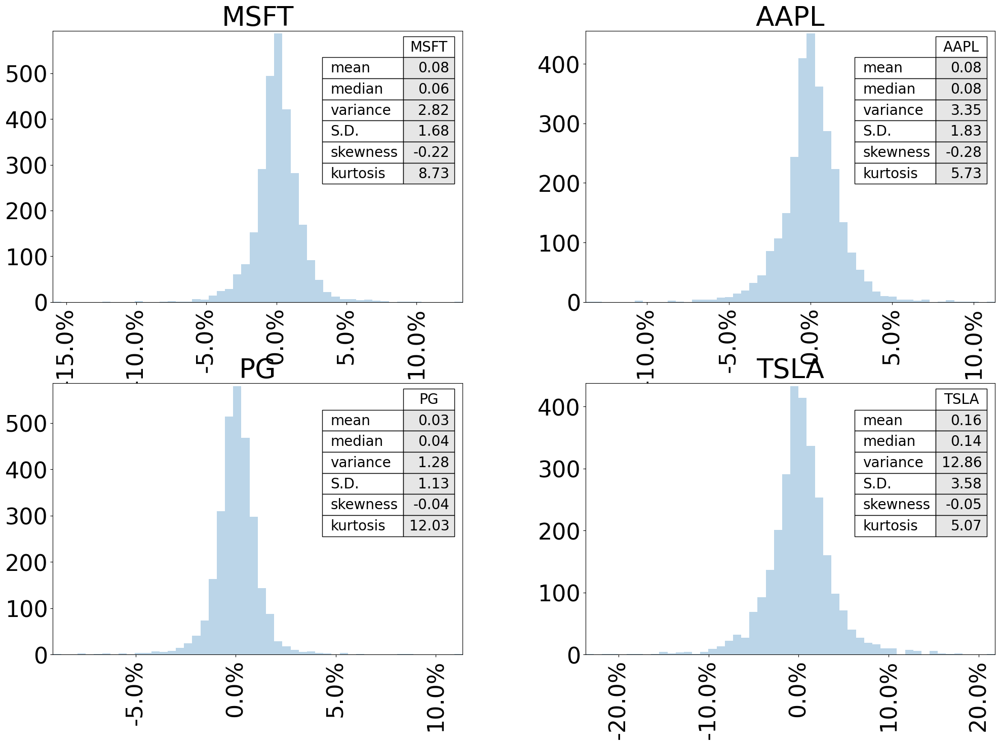

In [25]:
from pandas.plotting import table

# axs is a list of lists
# sublists contain relevant axes that comprise the multiplot
fig, axs = plt.subplots(2,2, figsize = (24, 16))
price_change_data.hist(bins = 50,
                      alpha = .3,
                      label = price_change_data.keys(),
                      ax = axs,
                      density = False)
# adjust the xtick labels in a multiplot by using a for loop 
# to acess sublists
for sublist in axs:
# and to access elements in each sublist
    for ax in sublist:
        x_vals = ax.get_xticks()
        ax.set_xticklabels([str(round(x * 100,1)) + "%" for x in x_vals],
                         rotation = 90)
        
        
        
        stock = ax.get_title()
        hist_data = stats_df[stock]
        
        stats = table(ax, hist_data,
                     colWidths = [.1],
                     cellColours = [[(.9,.9,.9)]] * 6,
                     loc = "upper right")
        stats.scale(1.25, 2.5)
        stats.auto_set_font_size(False)
        stats.set_fontsize(20)
        ax.grid(False)
        

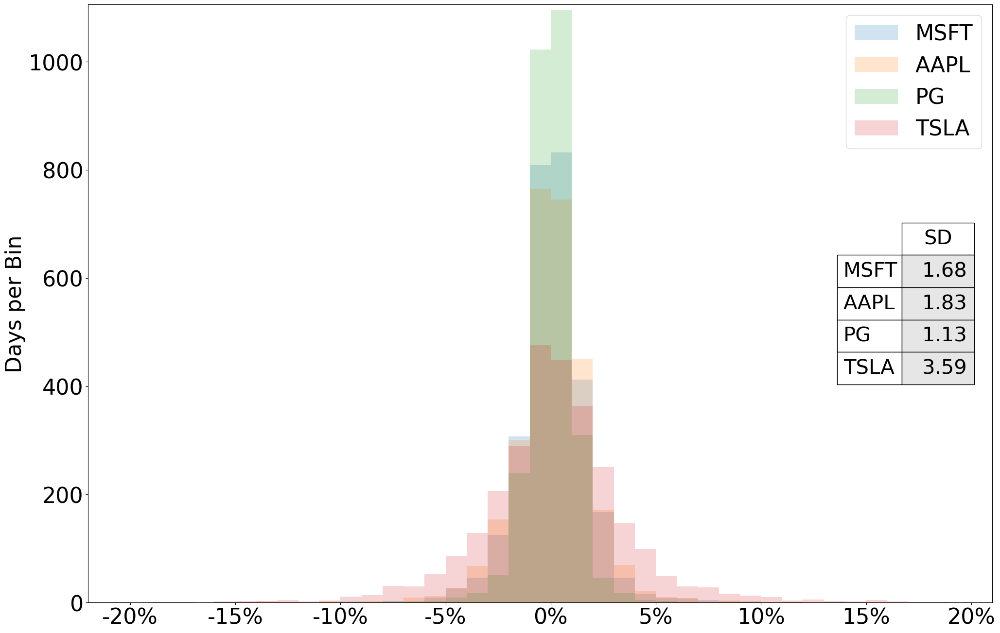

In [26]:
plot_data = price_change_data.mul(100)
fig, ax = plt.subplots(figsize = (24, 16))
for key in price_change_data:
                         # set bins to be length of 1%
    plot_data[key].hist(bins = [x for x in range(-22,22,1)],
                               alpha = .2,
                               label = key,
                               density = False,
                               ax = ax)
ax.set_ylabel("Days per Bin")
x_vals = ax.get_xticks()
ax.set_xticklabels([str(int(x))+ "%" for x in x_vals])
std_df = round(pd.DataFrame(plot_data.std(),
                           columns = ["SD"]),2)

stats =table(ax, 
             std_df, 
             colWidths=[.1], 
             cellColours=[[(.9,.9,.9)]]*4, 
             loc = "center right")
stats.scale(.8,4)
stats.auto_set_font_size(False)
stats.set_fontsize(30)
ax.grid(False)
plt.legend()

In [27]:
std_df

,SD
MSFT,1.68
AAPL,1.83
PG,1.13
TSLA,3.59


In [28]:
plot_data.std()

MSFT    1.679284
AAPL    1.830602
PG      1.133621
TSLA    3.585353
dtype: float64

In [29]:
# measure data in terms of standard deviations
norm_plot_data = price_change_data.div(price_change_data.std())
norm_plot_data

,MSFT,AAPL,PG,TSLA
Date,,,,
2012-01-03,NaN,NaN,NaN,NaN
2012-01-04,1.385181,0.292783,-0.039606,-0.369961
2012-01-05,0.605445,0.603125,-0.370540,-0.600268
2012-01-06,0.917966,0.568094,-0.212428,-0.216812
2012-01-09,-0.789027,-0.086717,0.371422,0.350194
...,...,...,...,...
2023-03-24,0.620855,0.451834,1.779445,-0.263876
2023-03-27,-0.896008,-0.675706,-0.464171,0.204321
2023-03-28,-0.248296,-0.217866,0.247461,-0.383602


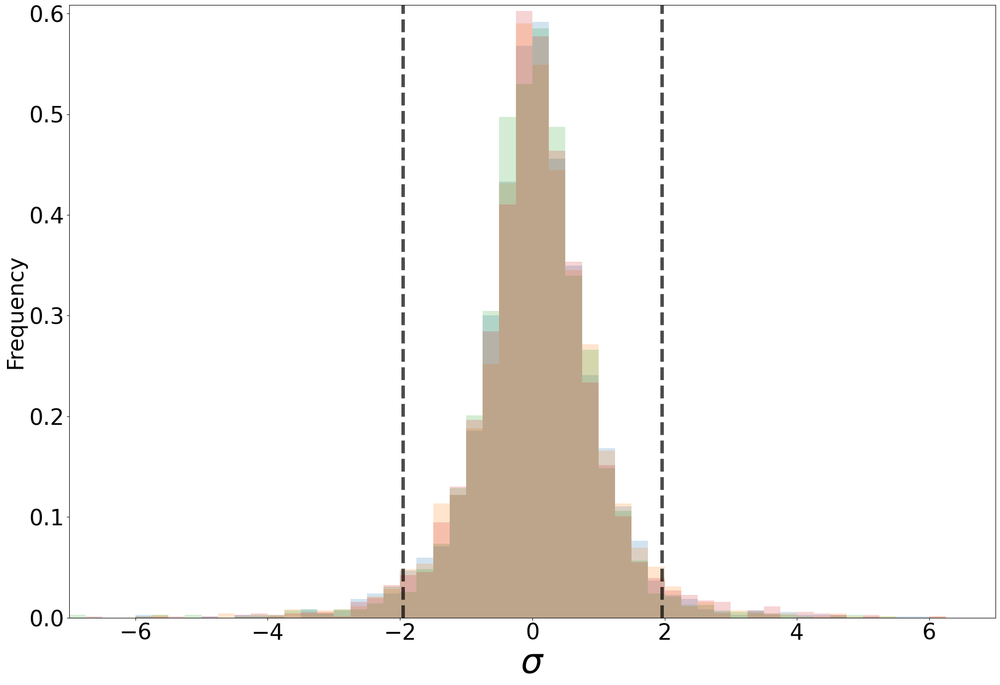

In [30]:
# replot after normalizing data by standard deviation
fig, ax = plt.subplots(figsize = (24, 16))
for key in norm_plot_data:
    norm_plot_data[key].hist(bins = [x / 4 for x in range(-28,29,1)],
                               alpha = .2,
                               label = key,
                             # setting density true shows frequency by units
                             #  of SDs
                               density = True,
                               ax = ax)
ax.set_ylabel("Frequency")
ax.set_xlabel("$\sigma$", fontsize = 50)
# If this is a normal distribution, 95% of the body of the distribution
#  should lie between -1.96 and 1.96 SDs from the mean
ax.axvline(-1.96, linewidth = 5, ls = "--", color = "k", alpha = .7)
ax.axvline(1.96, linewidth = 5, ls = "--", color = "k", alpha = .7)
ax.grid(False)

In [31]:
price_change_data["S&P 500"] = web.get_data_yahoo("^GSPC",
                                                 start,
                                                 end)["Close"]

[*********************100%***********************]  1 of 1 completed


In [32]:
price_change_data["S&P 500"] = np.log(price_change_data["S&P 500"]).diff()
price_change_data

,MSFT,AAPL,PG,TSLA,S&P 500
Date,,,,,
2012-01-03,NaN,NaN,NaN,NaN,NaN
2012-01-04,0.023261,0.005360,-0.000449,-0.013264,0.000188
2012-01-05,0.010167,0.011041,-0.004201,-0.021522,0.002939
2012-01-06,0.015415,0.010400,-0.002408,-0.007773,-0.002540
2012-01-09,-0.013250,-0.001587,0.004211,0.012556,0.002259
...,...,...,...,...,...
2023-03-24,0.010426,0.008271,0.020172,-0.009461,0.005624
2023-03-27,-0.015047,-0.012369,-0.005262,0.007326,0.001646
2023-03-28,-0.004170,-0.003988,0.002805,-0.013753,-0.001575


In [33]:
def calculate_beta(data, stock_key, market_key):
    df = data[[stock_key, market_key]].dropna()
    stock_cov = covariance(df[stock_key], df[market_key], sample = True)
    market_var = variance(df[market_key], sample = True)
    beta = stock_cov / market_var
    
    return beta

betas = {}
for stock in stocks:
    betas[stock] = calculate_beta(price_change_data, stock, "S&P 500")
pd.DataFrame(betas, index = ["$\\beta$"]).T

,$\beta$
MSFT,1.188908
AAPL,1.173311
PG,0.582171
TSLA,1.447453


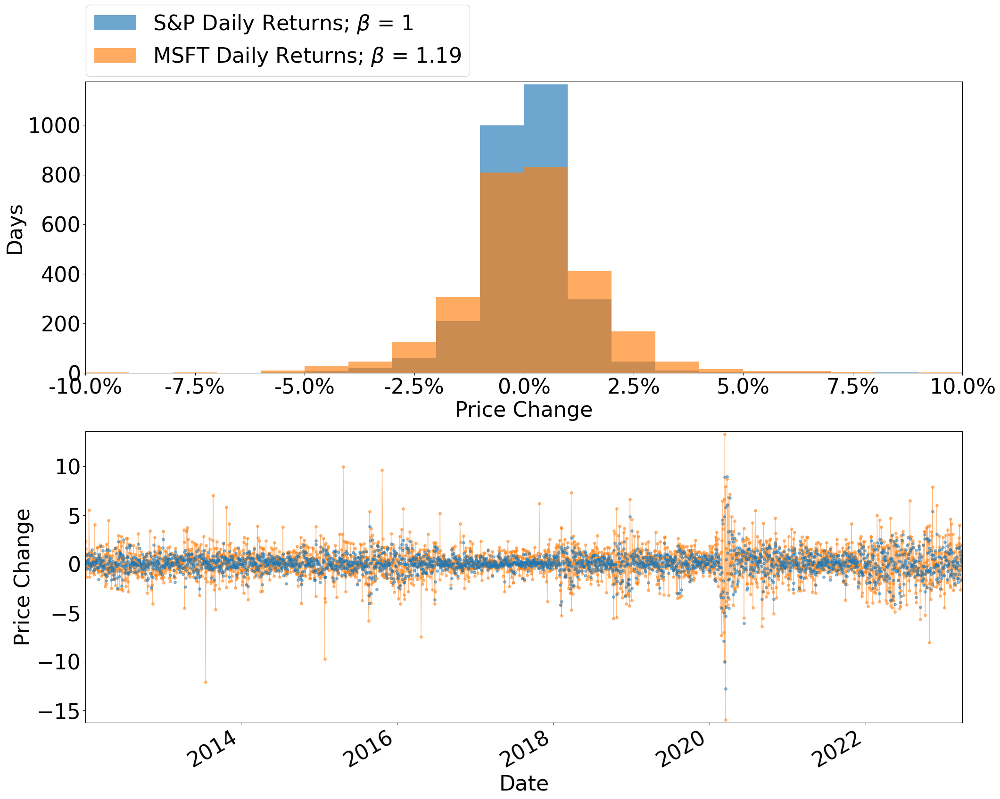

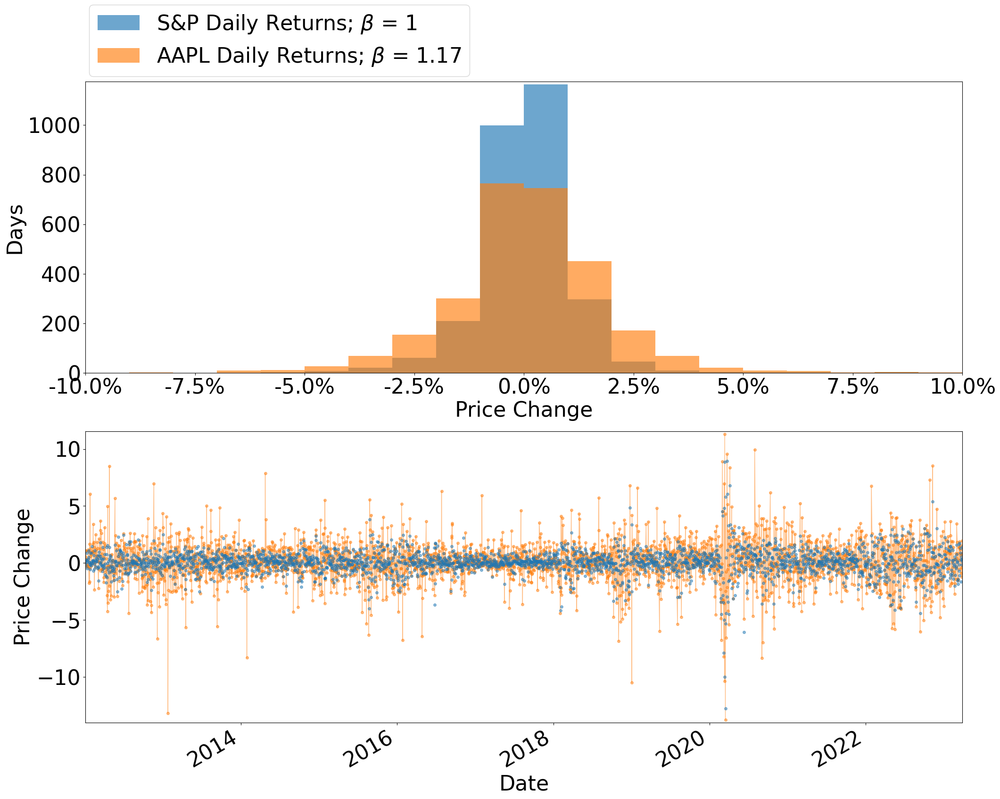

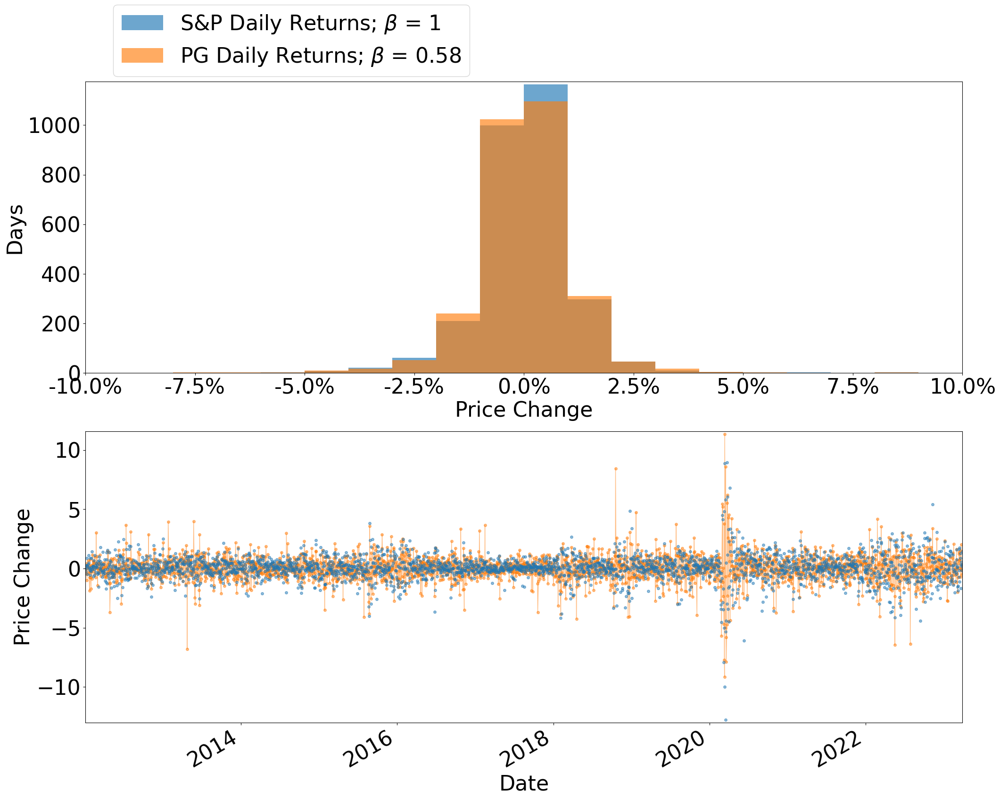

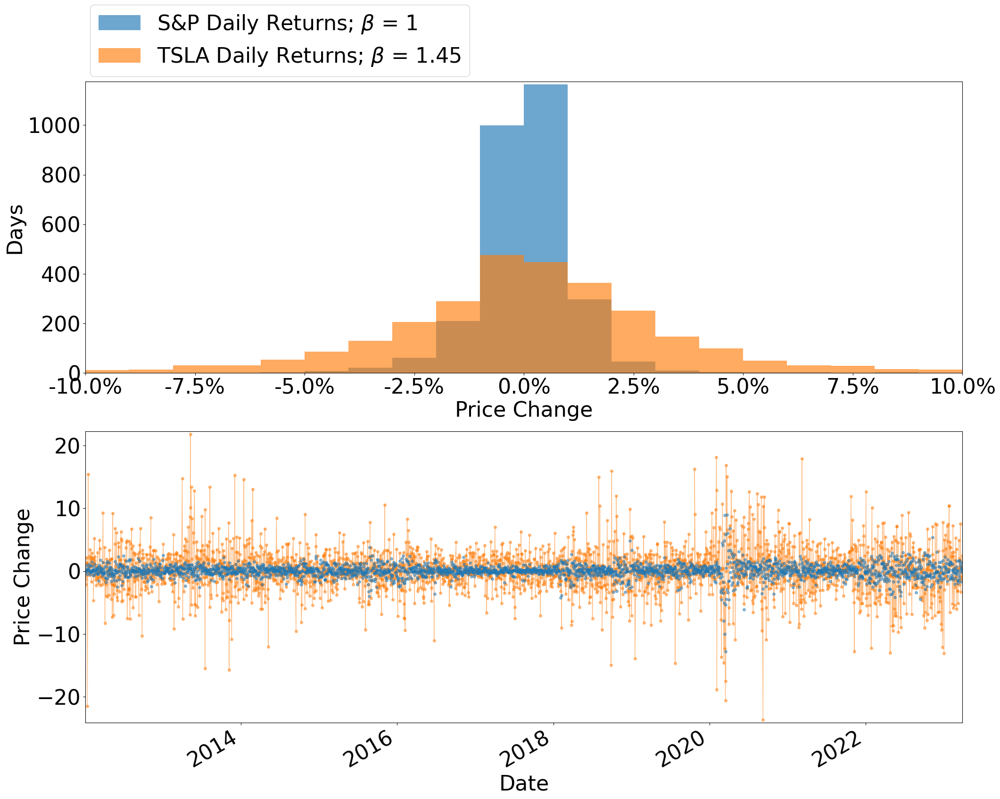

In [34]:
plot_data = price_change_data.mul(100)
for stock in stocks:
    fig, ax = plt.subplots(2, 1, figsize = (24,20))
    ## plot the distribution of data for S&P alongside each stock
    plot_data["S&P 500"].hist(
        bins = [x  for x in range(-10,11,1)],
        label = "S&P Daily Returns; $\\beta$ = " + str(1),
        ax = ax[0],
        density = False,
        alpha = .65)
    
    plot_data[stock].hist(
        bins = [x  for x in range(-10,11,1)],
        label = stock + " Daily Returns; $\\beta$ = " + str(betas[stock].round(2)),
        ax = ax[0],
        density = False,
        alpha = .65) 
    
    ax[0].legend(bbox_to_anchor = (.45, 1.3))
    ax[0].set_ylabel("Days")
    ax[0].set_xlabel("Price Change")
    ax[0].set_xticklabels([str(x) + "%" for x in ax[0].get_xticks()])
    ax[0].grid(False)

    ## plot a ts scatter of data for S&P alongside each stock
    plot_data[stock].plot(linestyle = "-",
                          linewidth = 1,
                                     marker = "o",
                                     alpha = .5,
                                     markersize = 4,
                                     color = "C1",
                                     ax = ax[1])        
    plot_data["S&P 500"].plot(linestyle = "",
                                     marker = "o",
                                     alpha = .5,
                                     markersize = 4,
                                     color = "C0",
                                     ax = ax[1])
    ax[1].set_ylabel("Price Change")


In [35]:
n = 100
m = 1000

dist_avgs = {"Die Rolls" : [],
            "Poisson":[],
            "Lognormal":[]}
# build a sample of m sample means from distributions of length n
for i in range(m):
    dist_avgs["Die Rolls"].append(mean(np.random.randint(1,7,n)))
    dist_avgs["Poisson"].append(mean(np.random.poisson(1, n)))
    dist_avgs["Lognormal"].append(mean(np.random.lognormal(0, 1, n))) 

# each column is a sample of sample means
dist_avgs = pd.DataFrame(dist_avgs)
dist_avgs

,Die Rolls,Poisson,Lognormal
0,3.46,1.02,1.733628
1,3.29,0.86,1.532813
2,3.51,0.91,1.425136
3,3.42,1.02,1.753043
4,3.85,0.95,1.761471
...,...,...,...
995,3.71,1.13,1.503783
996,3.43,1.20,1.240881
997,3.47,1.09,1.587587
998,3.37,0.98,1.567184


Text(0.5, 1.0, 'Non-Centered Distributions')

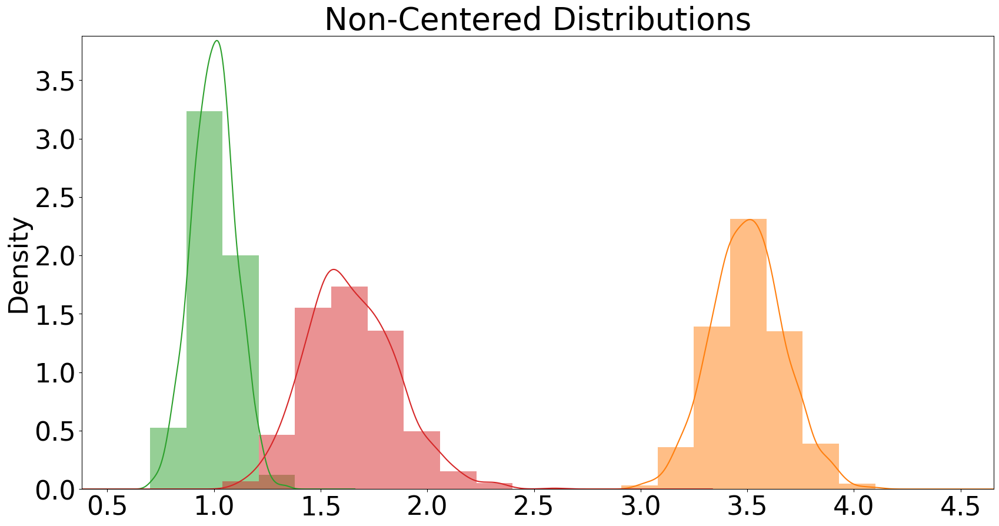

In [36]:
fig, ax = plt.subplots(figsize = (20,10))
dist_avgs.plot.hist(density=True,
                    ax=ax,
                    bins=20,
                    color=["C1", "C2", "C3"],
                    alpha=.5,
                   legend = False)
dist_avgs.plot.kde(ax=ax, color=["C1", "C2", "C3"], legend=False)
ax.set_title("Non-Centered Distributions")

In [37]:
means_df = pd.DataFrame()
sd_df = pd.DataFrame()
for key in dist_avgs:
    ## Center Distributions
    # df that centers the distributions at zero by substracting 
    #  the mean value from each sample mean
    means_df[key] = dist_avgs[key].sub(dist_avgs.mean()[key])
    ## Normalize Distributions
    # divide each observation by the distirbutions standard deviation
    sd_df[key] = means_df[key] / means_df.std()[key]
sd_df

,Die Rolls,Poisson,Lognormal
0,-0.255151,0.207965,0.406502
1,-1.257824,-1.378799,-0.532714
2,0.039753,-0.882935,-1.036321
3,-0.491074,0.207965,0.497309
4,2.045099,-0.486244,0.536726
...,...,...,...
995,1.219368,1.298865,-0.668487
996,-0.432093,1.993075,-1.898086
997,-0.196170,0.902174,-0.276533
998,-0.785978,-0.188726,-0.371962


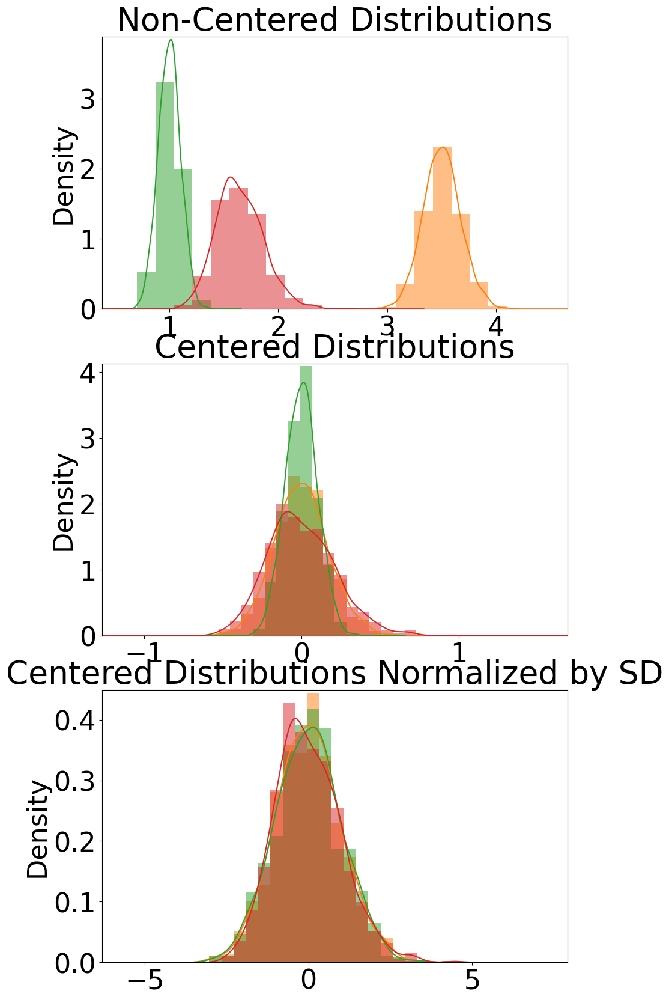

In [38]:
# save dfs in a single dictionary
df_dct = {"Non-Centered Distributions":dist_avgs,
         "Centered Distributions":means_df,
         "Centered Distributions Normalized by SD":sd_df}


# we will use the keys in the dictionary to call the each df
keys = list(df_dct.keys())
# automatically count number of keys in dictionary
num_figs = len(keys)
fig, axs = plt.subplots(num_figs, figsize=(10, 20))

# using a for loop with a dictionary of dfs will allows us to 
#  automate the creation of a multiplot
# cycle through each index value in the list of keys
for i in range(num_figs):
    # define the key by the index value
    key = keys[i]
    # select ax by index value
    ax = axs[i]
    # select dataframe that is linked to key
    plot_df = df_dct[key]
    # count the number of columns in the data frame
    #  this is number of distributions
    num_samples = len(plot_df.keys())
    # each distribution will be assigned its own color
    colors = ["C" + str(c + 1) for c in range(num_samples)]
    # first, plot the dataframe containing the distributions of the random sample means 
    plot_df.plot.hist(density=True,
                        ax=ax,
                        bins=20,
                        color=colors,
                        alpha=.5,
                       legend = False)
    # fit a distribution curve on the relevant data
    plot_df.plot.kde(ax=ax, color=colors, legend=False)
    ax.set_title(key)

## Simulation

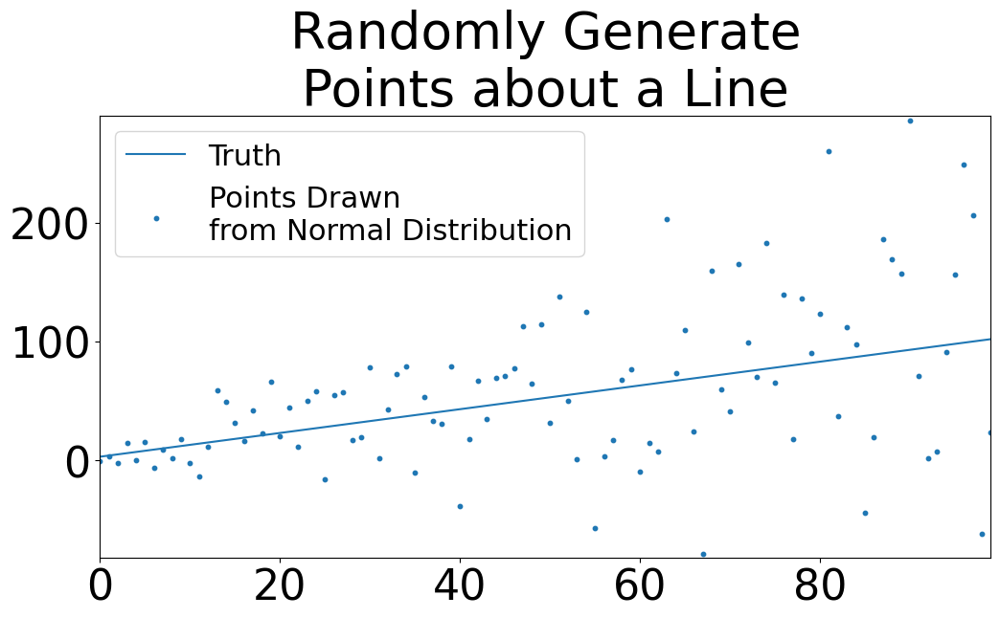

In [39]:
import random
line = np.array([i + 3 for i in range(100)])
points = []
# generate random points using the values from line
#  as mean and standard deviation
for point in line:
    #  random.normalvariate(mu=mean, sigma=SD)
    points.append(random.normalvariate(mu = point, 
                                       sigma = point))
figure = plt.figure(figsize = (12,6))
plt.plot(line, label = "Truth")
plt.scatter(np.arange(len(points)), 
            points, 
            label = "Points Drawn\nfrom Normal Distribution",
            s = 10)
plt.title("Randomly Generate\nPoints about a Line")
plt.legend(loc = "best", fontsize = 22)
plt.show()

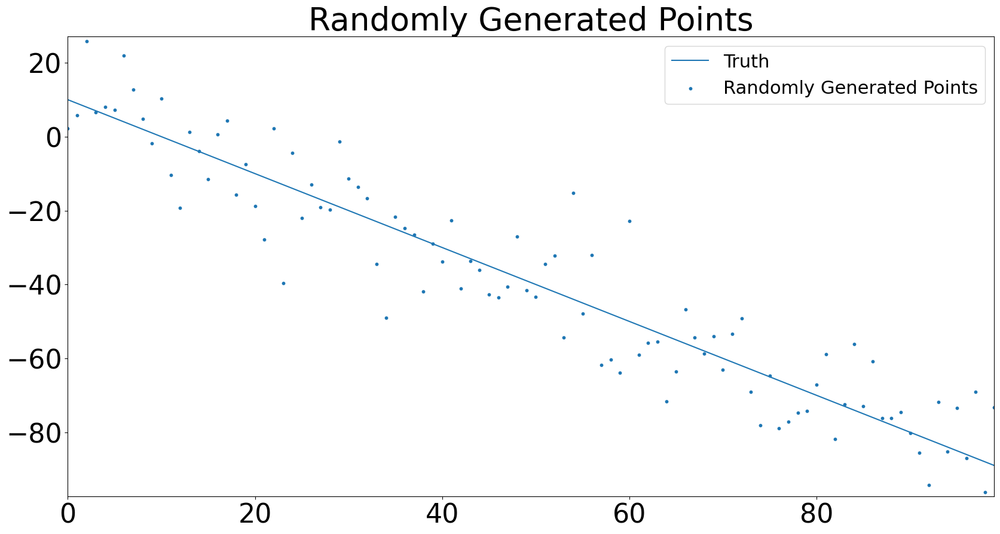

In [40]:
def build_random_data_with_line(y_int, slope, SD = 1):
    line = np.array([slope * (i) + y_int for i in range(100)])
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
    return line, points
def plot_line(line, points, line_name = "Truth",
             title = "Randomly Generated Points"):
    figure = plt.figure(figsize = (20,10))
    plt.plot(line, label = line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = title)
    plt.title(title)
    plt.legend(loc = "best", fontsize = 22)
    plt.show()
line, points = build_random_data_with_line(y_int = 10, slope = -1, SD = 10)
plot_line(line, points)

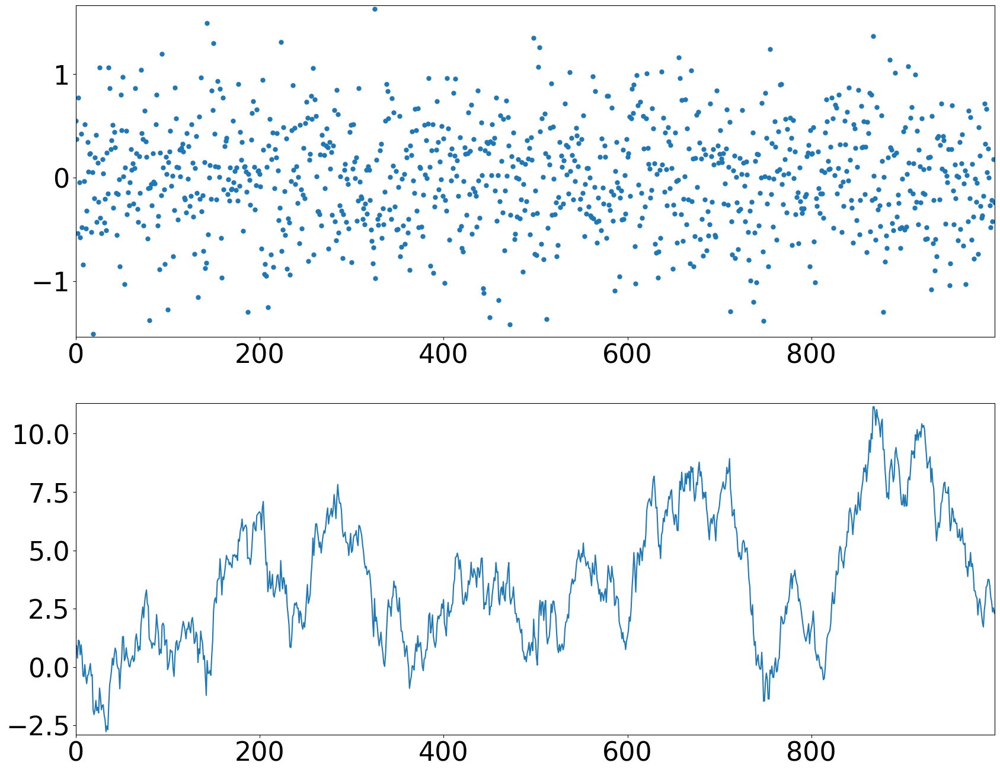

In [41]:
# single simulation

random_list = [random.normalvariate(0, .5) for i in range (1000)]
fig, axs = plt.subplots(2, figsize = (20,16))
axs[0].plot(random_list, ls = "", marker = ".", markersize = 10)

simulation = []
for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        # add last value observed in simulation + change (which is val)
        #  this will generate the latest value in the simulation
        simulation.append(simulation[-1] + val)
axs[1].plot(simulation)
plt.show()
plt.close()

In [45]:
# the differenced simulation data hsa the same values as the random list
pd.DataFrame(simulation[:10]).diff(), random_list

(          0
 0       NaN
 1  0.367944
 2 -0.536241
 3  0.769695
 4 -0.047573
 5 -0.578234
 6  0.423143
 7 -0.481740
 8 -0.842267
 9 -0.036203,
 [0.5461111420929387,
  0.36794424821636357,
  -0.536241043025852,
  0.7696947486476052,
  -0.047572757919316346,
  -0.5782342703562418,
  0.4231432560878003,
  -0.4817395370387467,
  -0.842267242277613,
  -0.03620342374734386,
  0.5132965548570689,
  -0.49089003130940434,
  -0.3198628978396289,
  0.3421131737049209,
  0.05801740697147518,
  0.22590259798732787,
  0.23243746852179606,
  -0.5265175767342156,
  0.05012022360744439,
  -1.5088187496601726,
  -0.2005648448678786,
  0.19058696309172043,
  0.40828439746153367,
  -0.4313584977022669,
  0.1391141929178634,
  -0.23488656475505526,
  1.0619754232621312,
  -0.3906899203105722,
  -0.5356691934355539,
  0.173326476301814,
  0.03971491140141674,
  -0.4358211174303882,
  -0.2077874990563891,
  -0.5079708086499032,
  0.2410221421781021,
  -0.15777535925502714,
  1.0608142152803504,
  0.86000106

In [75]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 1000
# iterate over the number of simulations
for i in range(num_sims):
    monte_carlo_sim_dict[i] = {}
    # run individual simulation
    for period in range(periods):
        # abbrev dictionary i name
        curr_sim = monte_carlo_sim_dict[i]
        if period == 0:
            curr_sim[period] = random.normalvariate(mean, sigma)
        else:
            curr_sim[period] = curr_sim[period - 1] + random.normalvariate(mean, sigma)
            

In [76]:
sim_df = pd.DataFrame(monte_carlo_sim_dict)
sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.386790,1.026364,-0.641557,-0.574797,-1.039536,2.135141,-0.366925,-0.075360,0.455275,0.867624,...,-0.007309,0.507487,0.984086,-1.846426,1.279581,2.339486,0.829990,-2.328271,-0.153619,1.228005
1,-0.619975,0.290302,-2.503869,-0.792442,-2.092713,0.774020,0.228370,-1.017950,-0.642986,0.111677,...,-0.711192,0.515366,1.691309,-2.238476,1.783585,1.475600,1.686333,-3.797187,0.563750,1.660034
2,-0.104922,-0.503187,-1.957716,-0.058779,0.057882,1.360273,1.054678,-0.894170,-0.755900,0.428155,...,0.648647,-2.621391,1.142107,-1.624848,1.923826,1.091178,1.477012,-3.884320,-0.056268,1.211208
3,-1.395746,-1.896761,-1.996901,-2.143708,-0.399091,0.022014,0.042428,-0.777228,-0.928763,1.322543,...,0.951402,-1.627371,1.839634,-0.153638,1.441039,0.294855,0.564016,-4.965317,-0.738090,2.035802
4,-1.269068,-1.357072,-2.177818,-2.976709,0.636952,0.598226,-0.742131,-2.758015,-1.076027,1.507166,...,1.419669,-3.419360,1.827011,-1.625939,0.698272,1.260949,2.850827,-4.949298,1.327099,1.728485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-7.117728,-0.263772,0.186784,-26.647352,-8.294421,-21.438830,-37.061039,-30.227074,-7.905266,16.601273,...,26.282495,-27.208977,81.526784,-23.086217,-42.134508,10.493300,10.282447,-47.619501,-7.221311,-21.277853
996,-7.755181,0.663743,0.833429,-27.522985,-9.160068,-21.660195,-38.860087,-30.892769,-6.593679,16.001571,...,28.209371,-27.392220,83.092752,-23.589292,-42.258223,11.496421,9.492904,-47.957910,-7.577442,-21.007952
997,-7.115672,1.268711,0.736070,-27.901950,-9.732418,-22.253969,-37.595791,-29.997939,-6.575179,17.127171,...,28.042644,-27.092766,80.418990,-24.075948,-40.507208,12.215786,9.778810,-48.328522,-7.183222,-22.274110
998,-8.189664,2.010273,1.170432,-27.212487,-9.425502,-20.972010,-37.745014,-29.435002,-5.994059,18.628806,...,29.107532,-26.671069,78.927230,-23.071712,-41.456185,11.291045,8.983308,-49.402104,-8.686695,-21.925886


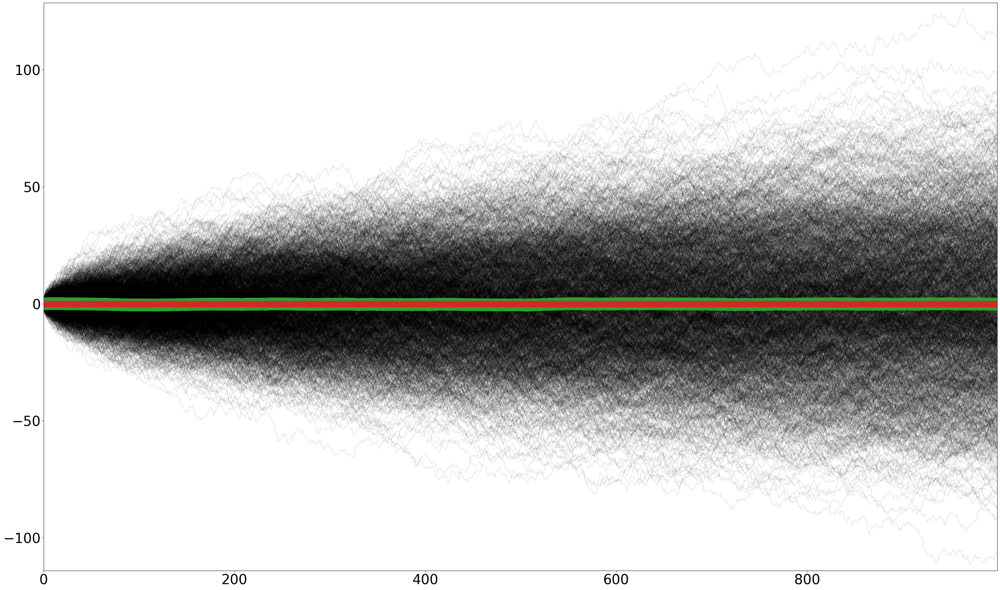

In [77]:
fig, ax = plt.subplots(figsize = (40, 24))
sim_df.plot.line(marker = ".", markersize = .1,
                 color = "k", alpha = .1,
                 ax = ax, legend = False)
# plot average by period across simulations
sim_df.mean(axis = 1).plot.line(color = "C2", ax = ax, linewidth = 30)
ax.axhline(0, linewidth =15, color = "C3")

[Text(0, 0.0, '0.0%'),
 Text(0, 0.002, '0.2%'),
 Text(0, 0.004, '0.4%'),
 Text(0, 0.006, '0.6%'),
 Text(0, 0.008, '0.8%'),
 Text(0, 0.01, '1.0%'),
 Text(0, 0.012, '1.2%'),
 Text(0, 0.014, '1.4%')]

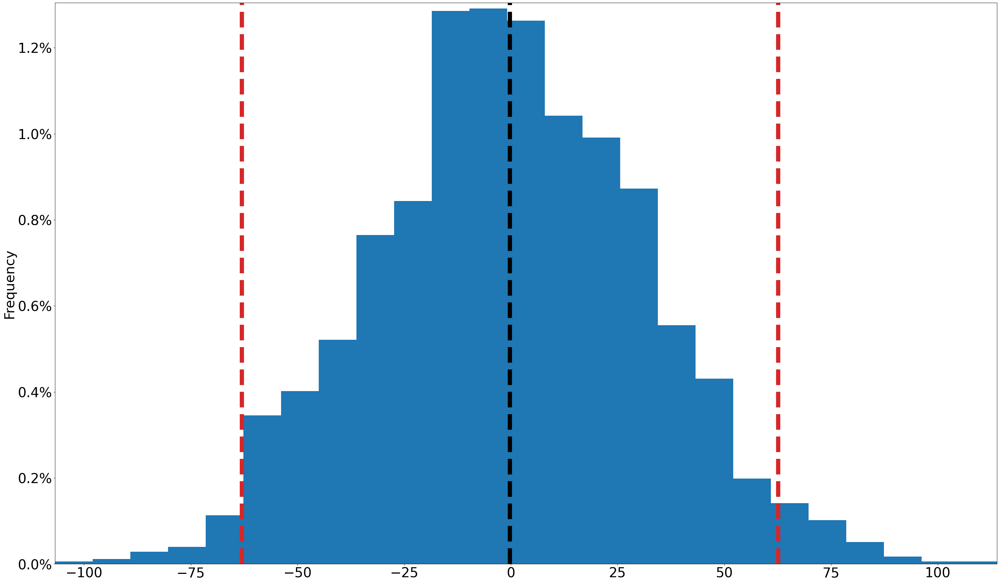

In [94]:
fig, ax = plt.subplots(figsize = (40,24))
plot_df = sim_df.iloc[-1]
plot_df.plot.hist(bins=25, 
                          density =True,
                          ax =ax)
ax.axvline(plot_df.mean(), ls = "--", 
           linewidth = 10, color = "k")
ax.axvline(plot_df.mean() + plot_df.std() * 2, ls = "--", 
           linewidth = 10, color = "C3")
ax.axvline(plot_df.mean() - plot_df.std() * 2, ls = "--", 
           linewidth = 10, color = "C3")
y_vals = ax.get_yticks()
ax.set_yticklabels([str(round(y * 100,1))+ "%" for y in y_vals]) 

In [63]:
sim_df.mean(axis = 1)

0      0.031713
1      0.010024
2      0.012158
3      0.031927
4      0.023162
         ...   
995   -0.288025
996   -0.291374
997   -0.284924
998   -0.278953
999   -0.294067
Length: 1000, dtype: float64